# Node classification with Node2Vec

This demo is derived from this [article](https://stellargraph.readthedocs.io/en/stable/demos/node-classification/node2vec-node-classification.html)


In this demo, we are going to apply Node2Vec into a node classification task. This demo is structured as follow:

- Introduction
- Dataset 
- Word2vec
- Node2vec
- Visualize embedding
- Node classification
- Conclusion

## Introduction

Today, we are going to hand on an example of node classification using the `Node2Vec` representation learning algorithm. The example uses components from the `stellargraph`, `gensim`, and `scikit-learn` libraries. 
- `stellargraph`: The StellarGraph library offers state-of-the-art algorithms for graph machine learning, making it easy to discover patterns and answer questions about graph-structured data. In this demo, `stellargraph` handles graph data and random walk algorithm
- `gensim`: Gensim is a free open-source Python library for representing documents as semantic vectors, as efficiently  and painlessly as possible. Gensim is used for training Word2Vec model in this experiment today.
- `scikit-learn` was introduced in last experiments. `scikit-learn` is used to create a simple classifer.

### Import

In [1]:
# install StellarGraph if running on Google Colab
import sys
if 'google.colab' in sys.modules:
  %pip install -q stellargraph[demos]==1.2.1

     |████████████████████████████████| 435 kB 8.2 MB/s 
     |████████████████████████████████| 376 kB 41.4 MB/s 
     |████████████████████████████████| 45 kB 3.9 MB/s 


In [2]:
# verify version
# verify that we're using the correct version of StellarGraph for this notebook
import stellargraph as sg

try:
    sg.utils.validate_notebook_version("1.2.1")
except AttributeError:
    raise ValueError(
        f"This notebook requires StellarGraph version 1.2.1, but a different version {sg.__version__} is installed.  Please see <https://github.com/stellargraph/stellargraph/issues/1172>."
    ) from None

In [3]:
# import lib
import matplotlib.pyplot as plt
import numpy as np

from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import accuracy_score

from stellargraph.data import BiasedRandomWalk # Second-order random walk
from stellargraph import StellarGraph
from stellargraph import datasets
from IPython.display import display, HTML

%matplotlib inline

## Dataset

The dataset used today is Cora dataset. The Cora dataset consists of *2708 scientific publications* classified into one of seven classes. The citation network consists of *5429 links*. Each publication in the dataset is described by a 0/1-valued word vector indicating the absence/presence of the corresponding word from the dictionary. The dictionary consists of *1433 unique words*.

For clarity, we use only the largest connected component, ignoring isolated nodes and subgraphs; having these in the data does not prevent the algorithm from running and producing valid results.



In [4]:
# load dataset
dataset = datasets.Cora()
# display(HTML(dataset.description))

# G is the whole graph and info
# node_subjects is label of documents
G, node_subjects = dataset.load(largest_connected_component_only=True)

In [ ]:
print(G.info())

StellarGraph: Undirected multigraph
 Nodes: 2485, Edges: 5209

 Node types:
  paper: [2485]
    Features: float32 vector, length 1433
    Edge types: paper-cites->paper

 Edge types:
    paper-cites->paper: [5209]
        Weights: all 1 (default)
        Features: none


In [ ]:
G.node_feature_shapes()

{'paper': (1433,)}

In [ ]:
G.node_features()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
print(type(node_subjects))
print('Number of documents', len(node_subjects))
print('Labels of documents:\n', node_subjects.unique())

<class 'pandas.core.series.Series'>
Number of documents 2485
Labels of documents:
 ['Neural_Networks' 'Rule_Learning' 'Reinforcement_Learning'
 'Probabilistic_Methods' 'Theory' 'Genetic_Algorithms' 'Case_Based']


## Word2vec

Word2Vec is one of the most popular technique to learn word embeddings using shallow neural network. It was developed by Tomas Mikolov in 2013 at Google. 

Its input is a text corpus and its output is a set of vectors: feature vectors that represent words in that corpus.

It can be obtained using two methods (both involving Neural Networks): Skip Gram and Common Bag Of Words (CBOW)

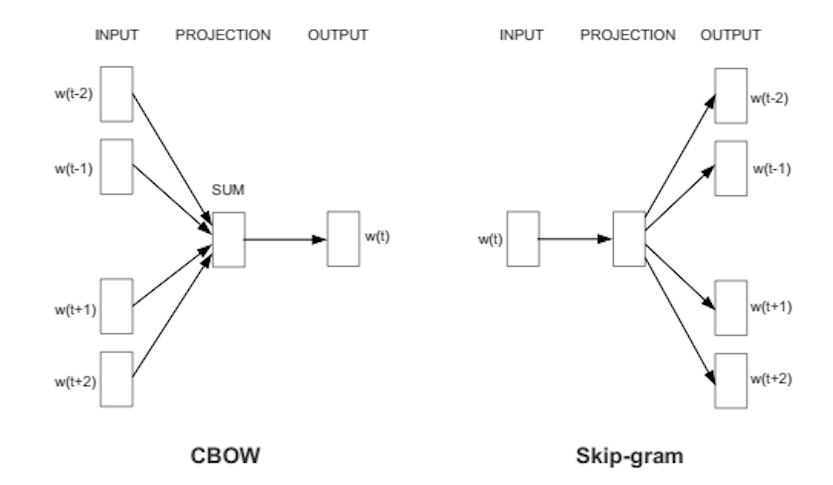

**Continuous Bag-of-Words (CBOW)**

CBOW predicts target words (e.g. ‘mat’) from the surrounding context words (‘the cat sits on the’).
Statistically, it has the effect that CBOW smoothes over a lot of the distributional information (by treating an entire context as one observation). For the most part, this turns out to be a useful thing for smaller datasets.

**Skip-Gram**

Skip-gram predicts surrounding context words from the target words (inverse of CBOW).
Statistically, skip-gram treats each context-target pair as a new observation, and this tends to do better when we have larger datasets.

Word2Vec uses a trick you may have seen elsewhere in machine learning.
Word2Vec is a simple neural network with a single hidden layer, and like all neural networks, it has weights, and during training, its goal is to adjust those weights to reduce a loss function. However, Word2Vec is not going to be used for the task it was trained on, instead, we will just take its hidden weights, use them as our word embeddings, and toss the rest of the model 

**Architecture**

The architecture is similar to an autoencoder’s one, you take a large input vector, compress it down to a smaller dense vector and then instead of decompressing it back to the original input vector as you do with autoencoders, you output probabilities of target words.

First of all, we cannot feed a word as string into a neural network.
Instead, we feed words as one-hot vectors, which is basically a vector of the same length as the vocabulary, filled with zeros except at the index that represents the word we want to represent, which is assigned “1”.

The hidden layer is a standard fully-connected (Dense) layer whose weights are the word embeddings.

The output layer outputs probabilities for the target words from the vocabulary.

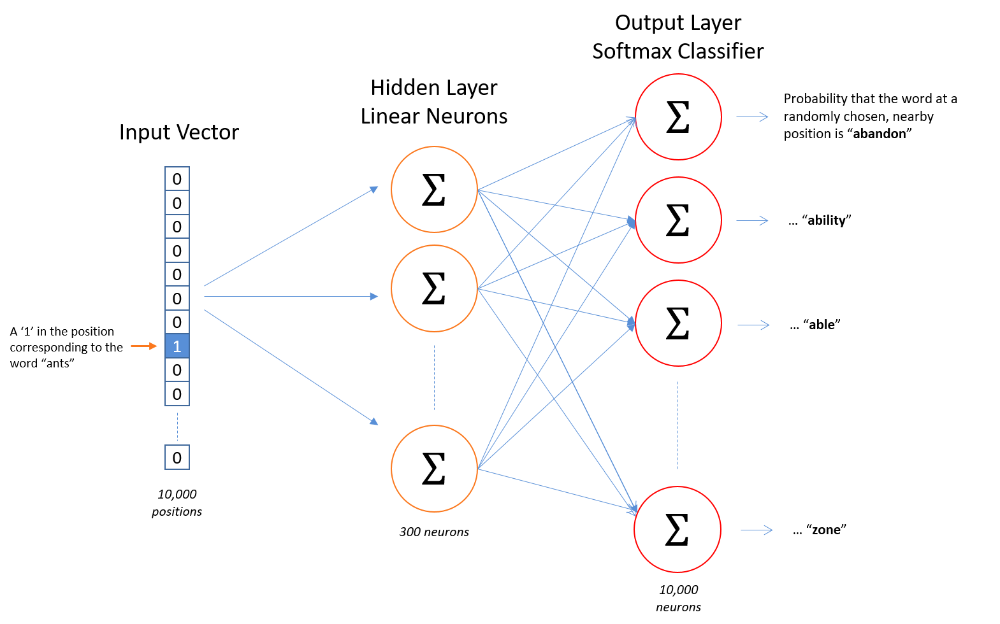

The rows of the hidden layer weight matrix, are actually the word vectors (word embeddings) we want!

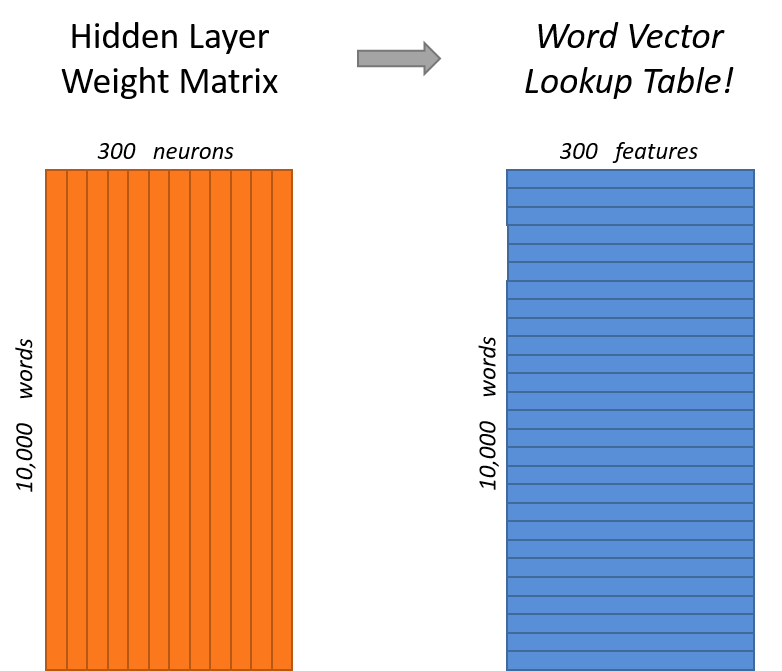

Word2Vec is able to capture multiple different degrees of similarity between words, such that semantic and syntactic patterns can be reproduced using vector arithmetic. Patterns such as “Man is to Woman as Brother is to Sister” can be generated through algebraic operations on the vector representations of these words such that the vector representation of “Brother” - ”Man” + ”Woman” produces a result which is closest to the vector representation of “Sister” in the model. Such relationships can be generated for a range of semantic relations (such as Country—Capital) as well as syntactic relations 

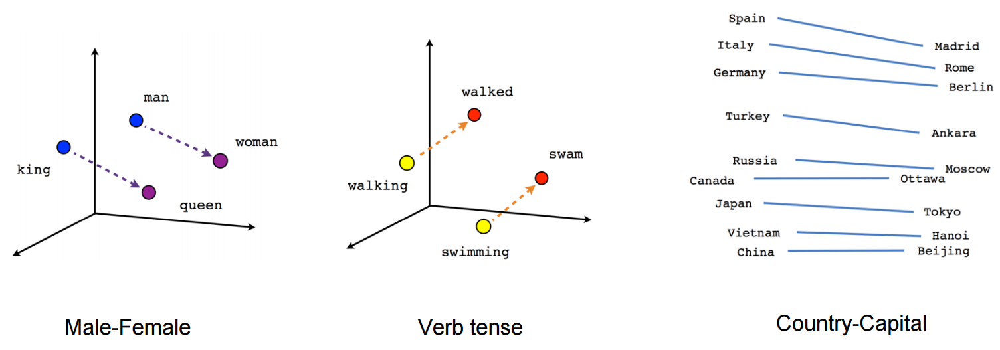

## Node2Vec

The Node2Vec algorithm is a 2-step representation learning algorithm. The two steps are,

1. Use second-order random walks to generate sentences from a graph. A sentence is a list of node ids. The set of all sentences makes a corpus.

2. The corpus is then used to learn an embedding vector for each node in the graph. Each node id is considered a unique word/token in a dictionary that has size equal to the number of nodes in the graph. The Word2Vec algorithm, is used for calculating the embedding vectors.

(take a look at this [article](https://towardsdatascience.com/node2vec-explained-graphically-749e49b7eb6b) for a more detailed explaination)


### Traditional approach

BFS, DFS 

### First-order random walk


A random walk on a graph can be thought of as a “walker” traversing the graph along the edges of the graph. At each step, the walker needs to decide where to travel next and then move to the next state. This process is referred to as a 1-hop transition. Let’s take a look at a simple example.

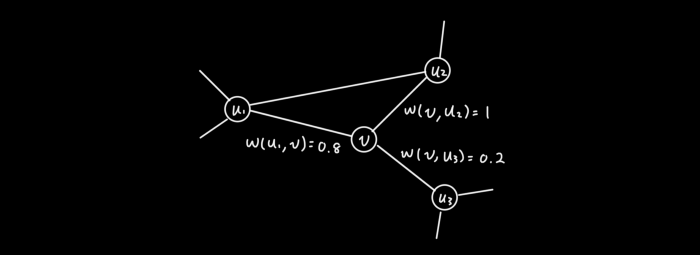

In this example, let’s assume the walker is currently on v, which has three neighboring nodes: u1, u2, and u3. Each neighbor connects to v with different weights, as shown in the figure. These weights are used to determine the probability of picking the next step. Specifically, the transition probabilities are calculated by normalizing the edge weights

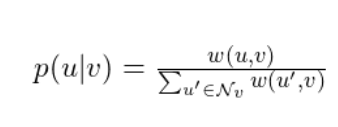

where N_v is the set of neighboring nodes of v, which are u1, u2, and u3 in this case.

Now that we understand how 1-hop transition is made via transition probabilities, we can move on to random walk generation. In short, a random walk is generated by carrying out multiple 1-hop transitions, where the previous 1-hop transition determines the current state.


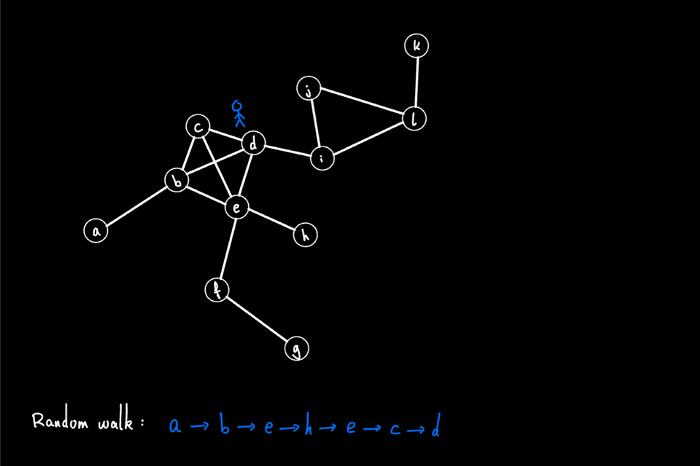

The random walk process continues until either it reaches the predefined “walk_length” or the walker reaches a “dead end” for a directed graph, i.e., the node has no outgoing edge. In this example, the random walk generated is the node sequence: [a, b, e, h, e, c, d, …]

What we’ve seen so far is called the first order random walk, which means that the 1-hop transition depends only on the current state. However, node2vec performs second order random walk, which is a slightly modified version that incorporates information from the previous step.

### Second-order random walk (Bias random walk)

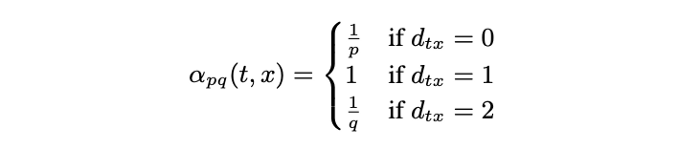

Instead of looking at direct neighbors of the current state, the second order transition applies a bias factor alpha to reweigh the edge weights depending on the previous state. 

In particular, alpha is a function that takes as inputs the current state and the potential next state. In the first case, if two states (nodes) are not connected, then alpha is set to be 1/q, where q is the in-out parameter. 

There are 3 cases needed to be handled:

- Return to the previous state. Denoted as 0 (returning)
- Go to a known node. Denoted as 1 (going inward)
- Go to an unknown node. Denoted as 2. (going outward)

Thus one can either increase the probability of going “outward” (meaning that the walk is not restricted in a localized neighborhood) by specifying a small q value or conversely restrict the walks to a local neighborhood by setting a large q value. In the second case, if the two states are identical, meaning that the walk is “returning” back to the previous state, then alpha is set to be 1/p, where p is the return parameter. Finally, if the two states are not identical and are connected, then alpha is set to 1.

Returning to our previous example on 1-hop transition and assuming that u2 is the previous state, the figure below highlighted the return edge with red and in-out edge with yellow. The bias factors alpha are assigned accordingly: 1/q for in-out (yellow), 1/p for return (red), and 1 otherwise.

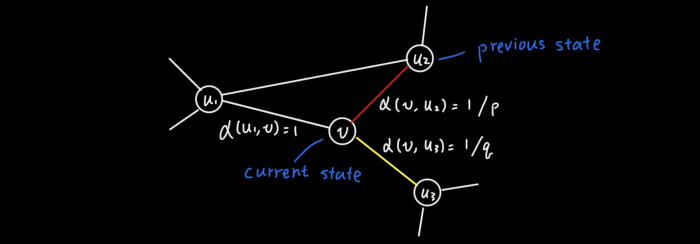

With these bias factors in hand, we can proceed to calculate the 2nd order transition probabilities as follow, which is very similar to what we’ve seen above for 1st order transition, but now each weight is biased by alpha.

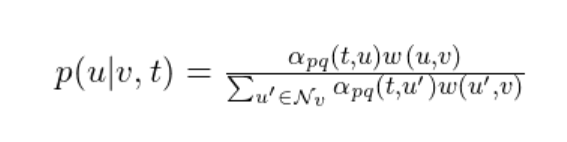

### Corpus generation using random walks

The stellargraph library provides an implementation for second-order random walks as required by Node2Vec. The random walks have fixed maximum length and are controlled by two parameters `p` and `q`. 

We are going to start 10 random walks from each node in the graph with a length up to 100. We set parameter `p` to 0.5 and `q` to 2.0.

In [5]:
rw = BiasedRandomWalk(G)

walks = rw.run(
    nodes=list(G.nodes()),  # root nodes
    length=100,  # maximum length of a random walk
    n=10,  # number of random walks per root node
    p=0.5,  # Defines (unormalised) probability, 1/p, of returning to source node
    q=2.0,  # Defines (unormalised) probability, 1/q, for moving away from source node
)
print("Number of random walks: {}".format(len(walks)))

Number of random walks: 24850


In [ ]:
walks[1][:10]

[31336, 686532, 31336, 31349, 686532, 31353, 1063773, 31353, 43698, 31353]

Besides Second-order walk, there are others walk algorithms so that you can try later. Check `stellargraph`'s [docs](https://stellargraph.readthedocs.io/en/stable/api.html#module-stellargraph.data) for other walk algorithms.

### Representation Learning using Word2Vec

We use the `Word2Vec`, implementation in the free Python library `Gensim`, to learn representations for each node in the graph. It works with `str` tokens, but the graph has integer IDs, so they're converted to `str` here.

We set the dimensionality of the learned embedding vectors to 128.

In [6]:
from gensim.models import Word2Vec

# As gensim requires string input, we have to convert node index into string
str_walks = [[str(n) for n in walk] for walk in walks]
model = Word2Vec(str_walks, 
                 size=128, window=5, min_count=0, sg=1, workers=2, iter=1)

In [ ]:
# The embedding vectors can be retrieved from model.wv using the node ID as key.
print(model.wv["19231"].shape)
print(model.wv["19231"][:10])

(128,)
[-0.22312841 -0.47370037  0.17619343  0.28444058  0.75284946 -0.5009236
  0.699972   -0.49922884  0.05741081 -0.00776936]


## Visualize Node Embeddings

### 2D visualazation

In [7]:
# Retrieve node embeddings and corresponding subjects
node_ids = model.wv.index2word  # list of node IDs
node_embeddings = (
    model.wv.vectors
)  # numpy.ndarray of size number of nodes times embeddings dimensionality
node_targets = node_subjects[[int(node_id) for node_id in node_ids]]

In [8]:
# Apply t-SNE transformation on node embeddings
tsne = TSNE(n_components=2)
node_embeddings_2d = tsne.fit_transform(node_embeddings)

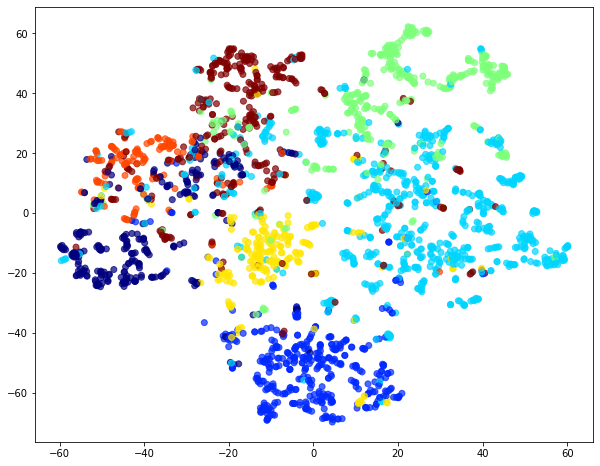

In [9]:
# draw the points
alpha = 0.7
label_map = {l: i for i, l in enumerate(np.unique(node_targets))}
node_colours = [label_map[target] for target in node_targets]

plt.figure(figsize=(10, 8))
plt.scatter(
    node_embeddings_2d[:, 0],
    node_embeddings_2d[:, 1],
    c=node_colours,
    cmap="jet",
    alpha=alpha,
)

### 3D visualization

In [ ]:
%reload_ext tensorboard
import numpy as np
import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile
from torch.utils.tensorboard import SummaryWriter
vectors = model.wv.vectors
metadata = node_subjects[[int(node_id) for node_id in node_ids]]
writer = SummaryWriter()
writer.add_embedding(np.array(vectors), metadata)
writer.close()
%load_ext tensorboard
# %tensorboard --logdir=runs

In [ ]:
%tensorboard --logdir=runs

Output hidden; open in https://colab.research.google.com to view.

## Node classification

The node embeddings calculated using `Word2Vec` can be used as feature vectors in a downstream task such as node attribute inference. 

In this example, we will use the `Node2Vec` node embeddings to train a classifier to predict the subject of a paper in Cora.

In [ ]:
# X will hold the 128-dimensional input features
X = node_embeddings
# y holds the corresponding target values
y = np.array(node_targets)

### Data Splitting

We split the data into train and test sets. 

We use 75% of the data for training and the remaining 25% for testing as a hold out test set.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.1, test_size=None)

In [ ]:
print(
    "Array shapes:\n X_train = {}\n y_train = {}\n X_test = {}\n y_test = {}".format(
                X_train.shape, y_train.shape, X_test.shape, y_test.shape
    )
)

Array shapes:
 X_train = (248, 128)
 y_train = (248,)
 X_test = (2237, 128)
 y_test = (2237,)


### Classifier Training

We train a Logistic Regression classifier on the training data. 

In [ ]:
clf = LogisticRegressionCV(
    Cs=10, cv=10, scoring="accuracy", verbose=False, multi_class="ovr", max_iter=300
)
clf.fit(X_train, y_train)

LogisticRegressionCV(Cs=10, class_weight=None, cv=10, dual=False,
                     fit_intercept=True, intercept_scaling=1.0, l1_ratios=None,
                     max_iter=300, multi_class='ovr', n_jobs=None, penalty='l2',
                     random_state=None, refit=True, scoring='accuracy',
                     solver='lbfgs', tol=0.0001, verbose=False)

Predict the hold out test set.

In [ ]:
y_pred = clf.predict(X_test)

Calculate the accuracy of the classifier on the test set.

In [ ]:
accuracy_score(y_test, y_pred)

0.7764863656683058

## Comment

Induction and Transduction
- Induction: Inductive learning is the same as what we commonly know as traditional supervised learning. We build and train a machine learning model based on a labelled training dataset we already have. Then we use this trained model to predict the labels of a testing dataset which we have never encountered before.
- Transduction: In contrast to inductive learning, transductive learning techniques have observed all the data beforehand, both the training and testing datasets. We learn from the already observed training dataset and then predict the labels of the testing dataset. Even though we do not know the labels of the testing datasets, we can make use of the patterns and additional information present in this data during the learning process.
Our simple demo on node classification task is transductive. We have embed all the graph before we can feed the embedded vectors in to classifier to predict label.
There are some latter approach try to make graph representation learning more inductive, but it is out of this demo's scope. So maybe you should try to figure it out yourself.

## Conclusion

Let's note some take-away keys:
- Second-order random walk
- How to implement Node2vec using `stellargraph` and `gensim`
- An example of node classification
- Transduction and Induction